# Guitar classifier
This classifier differentiates between Fender Stratocasters, Telecasters, Jazzmasters, Mustangs and Jaguars

In [40]:
import fastbook
fastbook.setup_book()

In [41]:
from fastbook import *
from fastai.vision.widgets import *

## Download images

In [4]:
import os
key = os.environ.get('AZURE_SEARCH_KEY', 'XXX')

In [43]:
guitar_types = 'stratocaster', 'telecaster', 'jazzmaster', 'jaguar', 'mustang'
path = Path('guitars')

In [44]:
if not path.exists():
  path.mkdir()
  for o in guitar_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_bing(key, f'fender {o}')
    download_images(dest, urls=results.attrgot('contentUrl'))

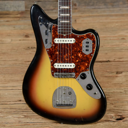

In [45]:
im = Image.open(get_image_files(path)[0])
im.to_thumb(128,128)

In [68]:
fns = get_image_files(path)
failed = verify_images(fns)
failed

(#0) []

In [69]:
failed.map(Path.unlink)

(#0) []

In [64]:
for o in guitar_types:
    for image in os.listdir(path/o):
        ext = os.path.splitext(image)[1]
        
        if ext in ['.png', '.gif']:
            img = Image.open(path/o/image)
            if img.mode != 'RGBA':
                new_filename = os.path.splitext(image)[0]+'.png'
                new_img = img.convert('RGBA')
                new_img.save(path/o/new_filename)
                print('saving: ' + new_filename)

## Send images to DataLoaders

In [70]:
guitars = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=20),
    get_y=parent_label,
    item_tfms=Resize(128),
    batch_tfms=aug_transforms(mult=2)
)

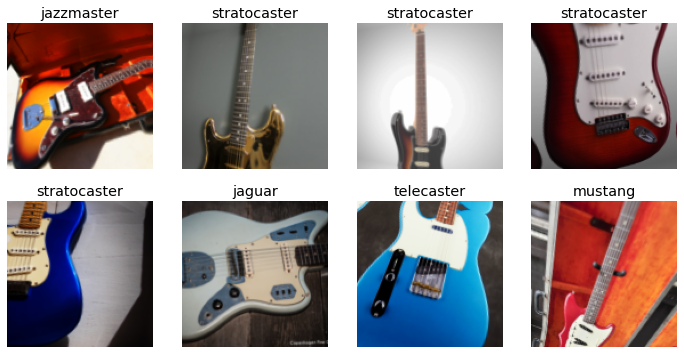

In [71]:
dls = guitars.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2)

## Training the model

In [72]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.643046,2.408902,0.588652,00:26


epoch,train_loss,valid_loss,error_rate,time
0,1.955225,1.377911,0.489362,00:29
1,1.785916,1.196492,0.354610,00:29
2,1.564377,1.169333,0.340426,00:28
3,1.400590,1.096059,0.333333,00:29


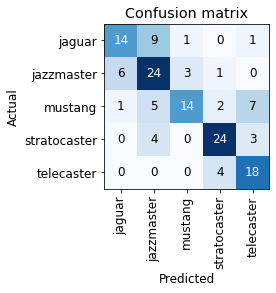

In [73]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [74]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [78]:
clean = False
if clean:
    for idx in cleaner.delete(): cleaner.fns[idx].unlink()
    for idx,cat in cleaner.change():
      try:
        shutil.move(str(cleaner.fns[idx]), path/cat)
      except:
        name, ext = str(cleaner.fns[idx]).split('.')
        newname = f'{name}{idx}.{ext}'
        os.rename(cleaner.fns[idx], newname)
        shutil.move(newname, path/cat)

## Export?

In [79]:
learn.export()

In [80]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('model.pkl')]

In [81]:
learn_inf = load_learner(path/'model.pkl')

In [82]:
learn_inf.dls.vocab

['jaguar', 'jazzmaster', 'mustang', 'stratocaster', 'telecaster']

## The App

In [83]:
btn_upload = widgets.FileUpload()
out_pl = widgets.Output()
lbl_pred = widgets.Label()
btn_run = widgets.Button(description='Classify', button_style='primary')
btn_clear = widgets.Button(description='Clear')
lbl_heading = widgets.Label('Upload your guitar!')

In [84]:
def on_click_classify(change):
  img = PILImage.create(btn_upload.data[-1])
  out_pl.clear_output()
  with out_pl: display(img.to_thumb(128,128))
  pred, pred_idx, probs = learn_inf.predict(img)
  lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)  

In [85]:
def on_click_clear(change):
  out_pl.clear_output()
  lbl_pred.value = ''

btn_clear.on_click(on_click_clear)

In [86]:
main_layout = Layout(display='flex', flex_flow='column', align_items='center')
VBox(children=[lbl_heading, btn_upload, btn_clear, btn_run, out_pl, lbl_pred], layout=main_layout)